In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !unzip "/content/drive/MyDrive/Dog_data/dog-breed-identification (1).zip" -d "drive/MyDrive/Dog_data"

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog given the image of the dog.

## 2. Data

The data used is Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities of breeds for each image. (metric: Multi Class Log Loss)

## 4. Features

Some info about the data:

* We're dealing with images (unstructured). So we should use Deep/Transfer learning models.
* There are 120 breeds of dogs (120 different classes).
* Around 10,000 images in the training set. (these have labels)
* Around 10,000 images in the test set. (these do not have labels)


## Get our workspace ready

* Import Tf 2.x
* Import Tf Hub
* Use a GPU

In [ ]:
# Import necessary tools

import tensorflow as tf
print("TF version: ", tf.__version__)
import tensorflow_hub as hub
print("Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU")
      else "not available")

TF version:  2.8.2
Hub version:  0.12.0
GPU available


## Getting our data ready (turning into Tensors)

ML models require data in numerical format. Lets convert the images into tensors (numerial representation).

Let's start by accessing the dat. Check out the labels.

In [ ]:
# Checkout the labels of our data

import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog_data/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


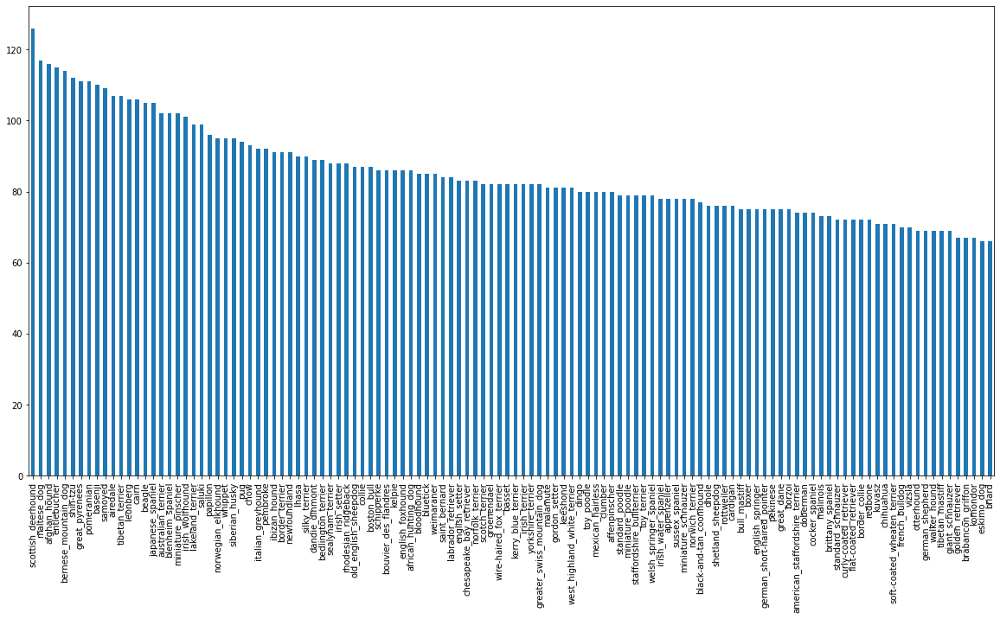

In [ ]:
# How many images are there of each breed

labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

In [ ]:
labels_csv["breed"].value_counts().mean()

# Google recommends a minimum of 10 images per class

85.18333333333334

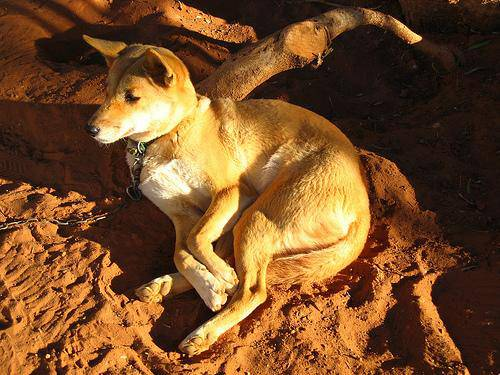

In [ ]:
# Let's view an image

from IPython.display import Image
Image("drive/MyDrive/Dog_data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from inage IDs

filenames = ["drive/MyDrive/Dog_data/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames

['drive/MyDrive/Dog_data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_data/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog_data/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog_data/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog_data/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog_data/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 'drive/MyDrive/Dog_

In [ ]:
# Check whether number of filenames matches number of image files

import os
if len(os.listdir("drive/MyDrive/Dog_data/train/")) == len(filenames):
  print("All data present.")
else:
  print("Some data is left out")

All data present.


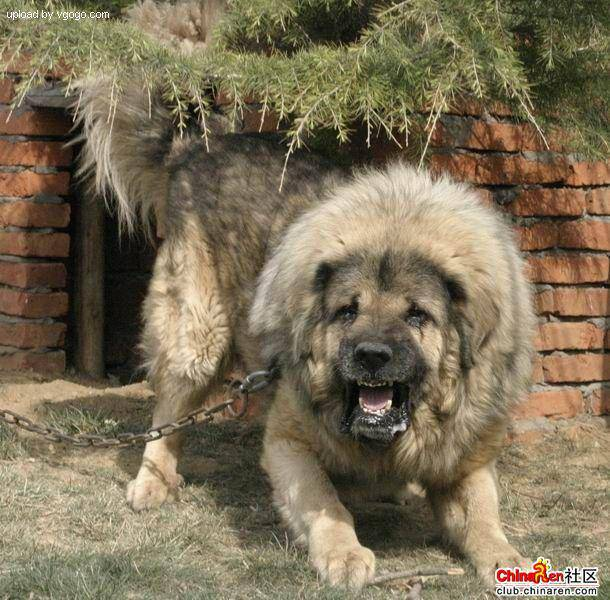

In [ ]:
# One more check

(Image(filenames[9000])) 

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have got our training image paths, let's prepare our labels.

In [ ]:
import numpy as np

labels = labels_csv["breed"].to_numpy()
# label = np.array(labels), does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Find unique label values

unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn all labels into a boolean array

boolean_labels = [label == unique_breeds for label in labels] 

In [ ]:
len(boolean_labels), len(labels)

(10222, 10222)

In [ ]:
# Convertig a boolean array into a binary array

print(labels[0]) # original label
print(np.where(labels[0] == unique_breeds)) # index in unique_breeds where the label occurs
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int)) # prints the labels in a binary format

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating a validation set

Since the dataset doesn't come with a validation dataset. We have to create on of our own.

In [ ]:
# setup x and y

x = filenames 
y = boolean_labels


We are going to start by experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting

NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation
np.random.seed(42)
from sklearn.model_selection import train_test_split

# Using NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size = 0.2,
                                                 random_state = 42)

len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# LEts look at the training data

x_train[0], y_train[0]

('drive/MyDrive/Dog_data/train/00bee065dcec471f26394855c5c2f3de.jpg',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
       

### Preprocessing images (turing images into tensors)

To do this, write a function which does:
1. Take an image file_path as input.
2. Use tf to read and save it into a variable `image`
3. Turn `image` (a jpg) into Tensors
4. Normal image tensor from 0-255 to 0-1
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified image.

Before we do , lets see how to import images.

In [ ]:
# Convert images to numpy arrays

from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now, that we have looked at what an image tensor looks like, lets make the function to preprocess them.

In [ ]:
# Define image_size
IMG_SIZE = 224

# Create a function for preprocessing images

def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image_path and turns it into a tensor and formats the tensor.
  """
  # Read the image file using tf
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0 - 255 to 0 to 1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to the desired size of (224, 244)
  image = tf.image.resize(image, [img_size, img_size])

  return image

In [ ]:
# tensor = tf.io.read_file(filenames[26])
# image = tf.image.decode_jpeg(tensor, channels = 3)
# image = tf.image.convert_image_dtype(image, tf.float32)
# image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
# image.shape

## Turning our data into batches

Why batches (why size 32)?

Let's say you are trying to process 10,000 images at once, they all might not fit into memory.
So that's why we do about 32 (batch size) at a time. This can be manually adujusted if needed.

Inorder to use tf effectively, we need our data in the form of a tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path and its label, processes it and returns a tuple (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now that we have all the data in the format of a tuple: `(image, label)`, let's make a function to turn all our data (`x` and `y`) into batches.

In [ ]:
# Define the batch size
BATCH_SIZE = 32 # 32 is the default anyways

# Creste a function to turn data into batches
def create_data_batches(x, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if its training data but doesn't shuffle if its validation data.
  Lso accepts test data as input (with no labels).
  """
  # If the data is a test dataset, we probably don't have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(x)) # No labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y))) # No labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If data is for training
  else:
    print("Creating data batches for training")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))

    # Shuffling pathnames and labels before mapping image process function us faster than shuffling images
    data = data.shuffle(buffer_size = len(x))

    # Create (image, labe) tuple, this also turns the image path into a preprocessed image
    data = data.map(get_image_label)

    # Turning training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Creating training and validation data_batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data = True)

Creating data batches for training
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labelsfrom data batch.
  """
  # Setup the fig 
  plt.figure(figsize = (10,10))

  # Loop through 25 for displaying 25 images
  for i in range(25):
    # Crweate subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image  label and as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

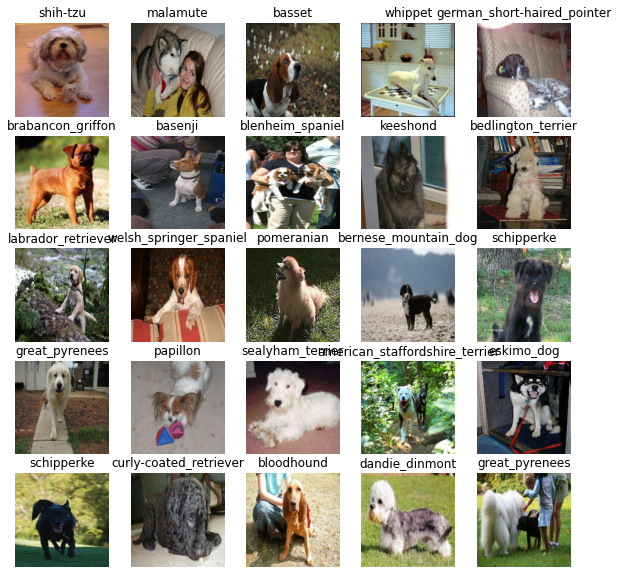

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# data gets shuffled each time a batch is created

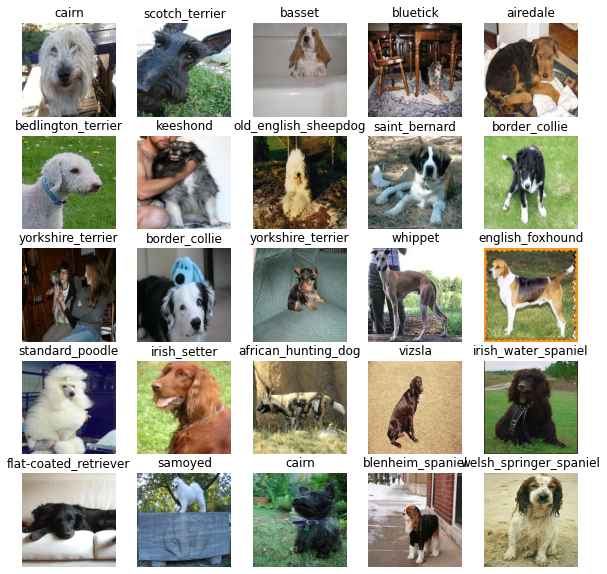

In [ ]:
# Now let's visualize the validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Data is not shuffled as each batch is created

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape to our model.
* The output shape of the model.
* The URL of the model from tf hub.

###Explore Imagenet for data


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got out input, output and model ready. Let's put them together into a Keras learning model.

Let's create a function which:
* Takes the input shape, output shape and the model we've chosen as paramters.
* Defines the layers in the Keras model in sequential fashion.
* Compiles the model. (evaluation and optimization).
* Builds the model (tells the model the input shape).
* Returns the model

All of these steps can be found on the keras guid on tensorflow.org.






In [ ]:
# Create a function which creates a keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
    tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                          activation = "softmax") # Layer 2 - output layer
  ])

  # Compile the model
  model.compile(
    loss = tf.keras.losses.CategoricalCrossentropy(),
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
  )

  # Build the model 
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do things like save its progress, check its progress or stop training early if model is not improving.

We will create two callbacks, one for TensorBoard which helps track our model's progress and another for early stopping if the model is not improving and prevent it from training for too long.

### Tensorboard Callback

To setup a Tensorboard callback, we need to do three things:
1. Load the tensorboard notebook extension.
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's fit function.
3. Visualize our model's training logs with tensorboard magic function after model training.

In [ ]:
# Load Tensorboard extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a tensorboard callback

def create_tensorboard_callback():
  # Create a log directory
  logdir = os.path.join("drive/MyDrive/Dog_data/logs", 
                        # Make it so that the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding pat
terns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [ ]:
# Create early stopping callback (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training a model (on subset of data)

The first model trains only on a part of the data to check the working of of the code.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min: 10, max: 100, step: 10}

In [ ]:
# Check for gpu

print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains the model

* Create a model using `create_model()`
* Setup a Tensorboard callback using `create_tensor_callback()`
* Call the `fit()` function on our model passing it the training  data, validation data, number of epochs and the callbacks.
* Return the model

In [ ]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given model and return the trained version.
  """

  # Create model
  model = create_model()

  # Create new Thensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fir the model to the passing it the callbacks
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fitting a model
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 132s 3s/step - loss: 4.6173 - accuracy: 0.0850 - val_loss: 3.5625 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 3s 123ms/step - loss: 1.6747 - accuracy: 0.6888 - val_loss: 2.2490 - val_accuracy: 0.4400
Epoch 3/100
25/25 [==============================] - 3s 126ms/step - loss: 0.5738 - accuracy: 0.9413 - val_loss: 1.6953 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 4s 153ms/step - loss: 0.2525 - accuracy: 0.9900 - val_loss: 1.5119 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 3s 122ms/step - loss: 0.1448 - accuracy: 0.9987 - val_loss: 1.4243 - val_accuracy: 0.6000
Epoch 6/100
25/25 [==============================] - 4s 153ms/step - loss: 0.0996 - accuracy: 1.0000 - val_loss: 1.3926 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================

Model is overfitting as val_accuracy is less even though train_accuracy is 100%

### Checking the tensorboard logs

The Tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog_data/logs

<IPython.core.display.Javascript object>

## Making and avaluating predictions using a trained model

In [ ]:
# Make predictions on the validaion data (as it is not use to train)
predictions = model.predict(val_data, verbose = 1)
predictions
# This is called confidence intervals

7/7 [==============================] - 1s 104ms/step


array([[2.8956332e-03, 7.1764582e-05, 1.0226370e-03, ..., 6.8725093e-04,
        8.9779598e-05, 5.8996989e-03],
       [1.1096665e-03, 1.8175079e-04, 5.9863590e-03, ..., 6.9648180e-05,
        4.2342255e-04, 2.5623331e-05],
       [7.9643301e-05, 7.2912261e-04, 1.0861849e-03, ..., 5.4636732e-04,
        7.7127377e-05, 1.7691037e-04],
       ...,
       [1.6833177e-06, 8.9414189e-06, 1.8465180e-04, ..., 1.8853243e-05,
        1.9029365e-05, 2.5895761e-05],
       [7.8503770e-04, 3.4535253e-05, 5.8433092e-05, ..., 1.6524920e-05,
        3.1477706e-05, 5.3850445e-03],
       [7.1691727e-04, 1.6315522e-05, 4.7523054e-04, ..., 1.5831097e-03,
        7.7455101e-04, 5.0119321e-05]], dtype=float32)

In [ ]:
predictions.shape # Contains the probabilities of all the breeds (softmax activiation)

(200, 120)

In [ ]:
len(y_val), len(unique_breeds)

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0000001

In [ ]:
# First prediction

ind = 42;

print(predictions[ind])
print(f"Max value of probabilities of prediction: {np.max(predictions[ind])} ")
print(f"Sum: {np.sum(predictions[ind])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[ind])]}")

[1.67621092e-05 7.16532013e-05 6.69655565e-05 1.97585414e-05
 1.01274357e-03 4.43868594e-05 5.59953260e-05 3.81954189e-04
 5.80981560e-03 2.26559620e-02 8.55498001e-06 1.57489387e-06
 1.11065565e-04 1.98549707e-03 3.75098985e-04 1.84898789e-03
 2.37782970e-05 6.47743000e-04 6.95243361e-05 4.17888223e-04
 3.20684048e-05 2.90089898e-04 2.13211497e-05 1.10956680e-05
 2.82652304e-03 2.74524591e-05 1.88935828e-05 2.07748963e-05
 1.86856065e-04 2.48874749e-05 1.93457272e-05 3.26098962e-05
 1.60050295e-05 6.93325546e-06 5.52981619e-05 8.12620692e-06
 6.99398370e-05 2.68415868e-04 1.33421681e-05 9.99356732e-02
 1.08699867e-04 3.04991818e-06 1.80226949e-03 1.56250405e-06
 1.60803262e-04 6.67112909e-05 4.32075845e-04 1.82505959e-04
 3.10433716e-05 1.15399751e-04 2.80138083e-05 7.78654939e-05
 1.32825822e-04 1.67933095e-03 4.07626203e-06 1.29843727e-04
 3.46333654e-05 4.96855246e-05 1.43987927e-05 6.17448823e-05
 9.31275372e-06 2.17917754e-04 3.80177789e-06 9.56933309e-06
 1.67623020e-05 3.499425

Making a function to predict all the validation data. Also visulize the predictions as well.

**Note:** Prediction probabilities also known as confidence intervals.

In [ ]:
# Turn prediction probabilities into respective labels

def get_pred_label(prediction_probabilities):
  """
  Turns an array of predicition probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Example
pred_label = get_pred_label(predictions[37])
pred_label

'doberman'

Since the validation data is a batch dataset. We need it in a list, so we have to un-batch it. Make predictions using the model and compare it to the truth labels.

In [ ]:
# Create a function to unbatch a batch dataset

def unbatchify(batch_data):
  """
  Takes a batch dataset and return seperate arrays of images and labels
  """
  images_ = []
  labels_ = []

  # Loop thorugh unbatch data

  for image, label in batch_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(predictions[0])

'irish_wolfhound'

### Visualizing model prediction

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the predictions is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:0.2f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

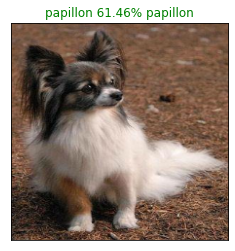

In [ ]:
plot_pred(prediction_probabilities = predictions, labels =  val_labels, images =  val_images, n = 73)

Viewing the model's top 10 predictions.

Lets create a function which:
* Take an imput of prediction array and a ground truth array and an integer.
* Find the prediciton using `get_preds`
* Find the top 10:
  * Prediction probabilities
  * Prediciton probabilities values
  * Prediciton labels
* Plot the top 10 prediciton probability values and labels, coloring the true label green.



In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plot the top 10 highest prediction confidences along wit hthe truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 confidences
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plots
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change the color of truth label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

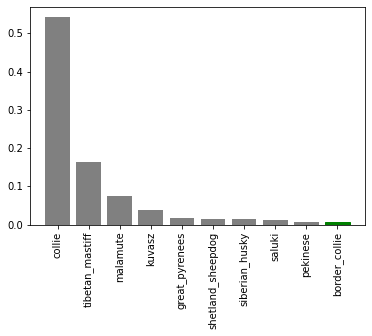

In [ ]:
plot_pred_conf(prediction_probabilities = predictions, labels = val_labels, n = 9)

 Let's see more predictions and their top ten predictions

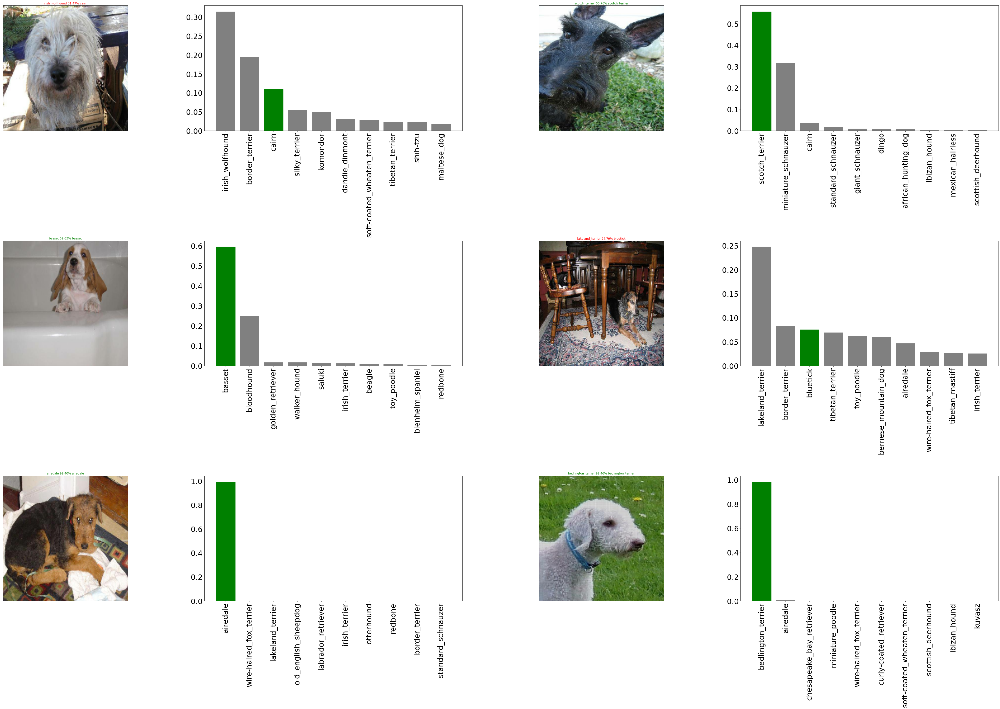

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (20*num_rows, 20*num_cols))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
            labels = val_labels,
            n = i+i_multiplier)
  plt.tick_params(labelsize = 30.0)
plt.tight_layout(h_pad = 1.5)
plt.show()

## Saving and reloading a model

In [ ]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a directory
  """
  # Create a model directory pathanme with the current time
  modeldir = os.path.join("drive/MyDrive/Dog_data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + suffix + ".h5" # .h5 is the same format
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """

  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

Let's load and save the model now.

In [ ]:
# Save our model trained on on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog_data/models/20220621-1958501000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog_data/models/20220621-1958501000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog_data/models/20220621-1548501000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog_data/models/20220621-1548501000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.2237 - accuracy: 0.6650


[1.2236793041229248, 0.6650000214576721]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.3414 - accuracy: 0.6650


[1.341387152671814, 0.6650000214576721]

## Training the model on the total data

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
x[:10]

['drive/MyDrive/Dog_data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(x_train)

800

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating data batches for training


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

In [ ]:
full_model.fit(x = full_data,
               epochs = 100,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 35s 99ms/step - loss: 1.3220 - accuracy: 0.6753
Epoch 2/100
320/320 [==============================] - 32s 99ms/step - loss: 0.3950 - accuracy: 0.8844
Epoch 3/100
320/320 [==============================] - 31s 96ms/step - loss: 0.2362 - accuracy: 0.9357
Epoch 4/100
320/320 [==============================] - 32s 98ms/step - loss: 0.1549 - accuracy: 0.9642
Epoch 5/100
320/320 [==============================] - 33s 103ms/step - loss: 0.1055 - accuracy: 0.9768
Epoch 6/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0765 - accuracy: 0.9884
Epoch 7/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0603 - accuracy: 0.9906
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0467 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0375 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 34s 107ms/st

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog_data/models/20220621-201400full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog_data/models/20220621-201400full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Loading the full model
loaded_full_model = load_model("drive/MyDrive/Dog_data/models/20220621-172809full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog_data/models/20220621-172809full-image-set-mobilenetv2-Adam.h5


## Making predictions on test dataset

Since our model has trained, we have to make predictions. Let's start off by convert the test data into numbers.

Lets use the functions we have created.

To make predictions on the test data, we will:
* Get the image filenames
* Convert the filenames into test data batches using
`create_data_batches()` and setting the `test_data` paramter to `True`.
* Make a predicitons array by passing the test batches to `predict()` method called on the model.


In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog_data/test/"
test_filenames = [test_path +fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_data/test/dff4932a639f0bf9b1e693fff89fc898.jpg',
 'drive/MyDrive/Dog_data/test/dcb9aeaf9f1a5c11e95509376d8788ca.jpg',
 'drive/MyDrive/Dog_data/test/e2faaf5e760a6189d0980e6355864b4c.jpg',
 'drive/MyDrive/Dog_data/test/ddf2401701ee374c0f1f9dd607071ec7.jpg',
 'drive/MyDrive/Dog_data/test/de9fc145601771b7a5b7e68822416fb5.jpg',
 'drive/MyDrive/Dog_data/test/e5e51d0dfc3ccdb74de51933b2671742.jpg',
 'drive/MyDrive/Dog_data/test/e218c0da622fedc975a97999ad7d48a5.jpg',
 'drive/MyDrive/Dog_data/test/e05367db91d0449b2afe76a1b7acc1c8.jpg',
 'drive/MyDrive/Dog_data/test/e334f758c7944df19c98d49498d28c64.jpg',
 'drive/MyDrive/Dog_data/test/e137b0cd96051765c349377725c4696d.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**NOTE:** Calling predict on our full model and passing it the test data will take a long time to run.

In [ ]:
# Make predicitons on test data batch using loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

324/324 [==============================] - 176s 517ms/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog_data/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog_data/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions[:10]

array([[4.35526222e-02, 4.26610995e-06, 9.52609389e-06, ...,
        2.31776107e-06, 3.77798187e-06, 2.13668420e-04],
       [1.33350553e-10, 3.41238916e-07, 6.14092666e-10, ...,
        6.32096047e-08, 7.79276379e-05, 7.01800309e-06],
       [3.37821871e-06, 1.34172398e-04, 1.57527011e-05, ...,
        2.34913296e-06, 2.69509419e-05, 4.99981434e-05],
       ...,
       [5.18488811e-12, 2.93273700e-07, 2.64257483e-09, ...,
        4.56252167e-07, 5.13535383e-08, 1.72984769e-11],
       [1.03139855e-05, 5.18667704e-08, 2.96910343e-07, ...,
        1.07249598e-07, 9.05149427e-05, 9.05598881e-06],
       [4.41290240e-08, 2.46665365e-07, 2.56152560e-07, ...,
        2.24373711e-08, 5.51424855e-05, 9.47112710e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test data predictions for Kaggle submission

Observe the sample submissions from Kaggle.
We need the prediction probabilites of the model in a dataframe with ID for each test file.

To get the data in this format, 
* Create a pandas DataFrame with an ID column as well as a column for each dog breed. 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ids to predictions dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.to_csv("drive/MyDrive/Dog_data/full_model_predictions_submission_1_mobilenetV2.csv",
                index = False)

## Making predictions on custom images

To make predictions on custom images, we will:
* Get the filepaths of our images (after uploading)
* Turn the filepath into data batches using `create data bacthes()`. Also set `test_data` to True and we dont have labels for our data.
* Pass the custom image data to our model's `predict()` method
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.


In [ ]:
# Custom image file path
custom_path = "file_path"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

In [ ]:
# Tur custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)